In [1]:
import aco
from datetime import datetime, timedelta
import IPython
from matplotlib import pyplot as plt

import numpy as np
import scipy.signal as signal
import scipy

%matplotlib inline 
# notebook

loader = aco.ACOio('../raw/')

date = datetime(day=19, month=2, year=2016, hour=7, minute=30)
src = loader.load(date)
src.Listen()

In [2]:
snap = src[
    timedelta(minutes=2, seconds=40):
    timedelta(minutes=2, seconds=45)]


In [3]:
parms = dict(frame_duration=.08, frame_shift=.02)


/home/probinso/git/Whales/code/aco.py:175: UserWarning: Only 0.058 of signal represented
  warnings.warn(f'Only {fs_ratio:.3f} of signal represented', UserWarning)


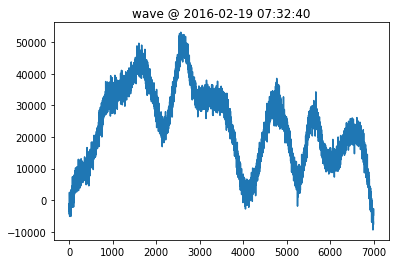

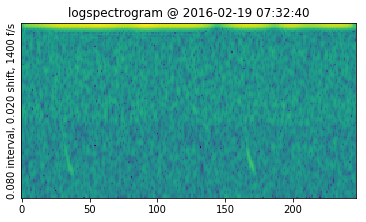

In [4]:
down = snap.resample(n=7000) # 15000
down.View()
down.View('logspectrogram', **parms)
down.Listen()

INFO:PyEMD.EMD:Max iterations reached for IMF. Continueing with another IMF.


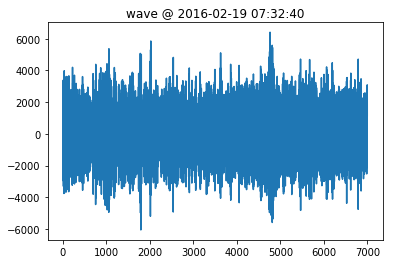

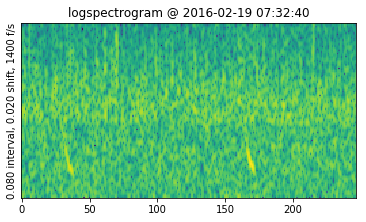

In [5]:
centered = down.remove_dc(levels=2)
centered.View()
centered.View('logspectrogram', frame_duration=.08, frame_shift=.02)
centered.Listen()

In [6]:
noise = centered[timedelta(seconds=1):timedelta(seconds=3)]
noise.Listen()

In [7]:
noise._Frame().data.shape

(97, 112)

In [8]:
noise._fs * (.25 * .08)

28.0

In [9]:
data = centered._Frame(**parms).data
size = data.shape[1]
window = signal.get_window('boxcar', size)
power = signal.welch(
    noise._data, window=window, return_onesided=False, 
    scaling='spectrum', noverlap=size//4)[1] * window.sum()**2

out = np.full_like(data, np.NAN)

def spectral_subtractor(power, window):

    def spectral_subtraction(Frames):
        spectrum = scipy.fftpack.fft(Frames * window)
        amplitude = np.abs(spectrum)
        phase = np.angle(data)

        _ = (amplitude ** 2.0) - (power * 5.0)
        _ = np.maximum(_, .01 * amplitude ** 2)
        _ = np.sqrt(_)
        _ = _ * np.exp(phase*1j)

        return _
    return spectral_subtraction


spectral_subtraction = spectral_subtractor(power, window)
out = spectral_subtraction(data)



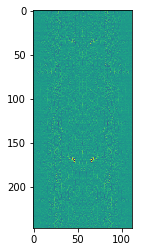

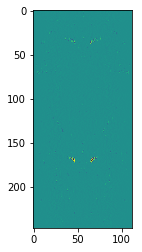

In [10]:
plt.figure()
plt.imshow(scipy.fftpack.fft(data).real)
plt.figure()
plt.imshow(out.real)

In [11]:
plt.imshow(centered._spectral_subtraction(noise))

NameError: name 'window' is not defined

In [ ]:
shift_size = int(np.round(.02 * centered._fs))


scipy.fftpack.ifft(out).shape

In [ ]:
autonoise = signal.correlate(noise._data, noise._data, 'same')
autonoise.shape, noise._data.shape

In [ ]:
fig = plt.figure()
f, t, Zxx = signal.stft(autonoise, noise._fs)
_ = plt.pcolormesh(t, f, np.abs(Zxx))
sub = Zxx.mean(axis=1)
sub.shape

In [ ]:
f, t, Zxx = signal.stft(centered._data, centered._fs)
i, a = np.abs(Zxx).min(), np.abs(Zxx).max()

In [ ]:
fig = plt.figure()
_ = plt.pcolormesh(t, f, np.abs(Zxx), vmin=i, vmax=a)

fig = plt.figure()
newspec = (Zxx.T - sub).T
_ = plt.pcolormesh(t, f, np.abs(newspec))

fig = plt.figure()
diff = Zxx - newspec
_ = plt.pcolormesh(t, f, np.abs(diff))

In [ ]:
_, x = signal.istft(newspec, fs=centered._fs)

fs = 16000
fs_ratio = fs/centered._fs
A = signal.resample(x, int(np.round(len(x)*fs_ratio)))
B = centered._resample_fs(fs)
size = min(len(A), len(B))

from IPython.display import Audio
display(Audio(data=A[:size], rate=fs))
display(Audio(data=B[:size], rate=fs))
display(plt.plot(A[:size]-B[:size]))

In [ ]:
p_s_w = centered.spectrogram(**parms).data
p_n_w = noise.spectrogram(**parms).data

In [ ]:
p_n_w.shape, p_s_w.shape

In [ ]:
import scipy.signal as signal

x = signal.welch(centered._data, window=noise._data, scaling='spectrum')[1] * noise._data.sum() ** 2
